In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, random_split
import tifffile as tiff
import czifile
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from PIL import Image
from tqdm import tqdm
from torchvision import transforms
from skimage import io
import sys
# from umap import UMAP
import joblib
import pandas as pd

# Load Data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [2]:
# Get the directory of the script
script_dir = os.getcwd()

# Get the parent directory of the script
parent_dir = os.path.dirname(script_dir)

# Add the parent directory to sys.path
sys.path.append(parent_dir)

from core.autoencoders import AE




In [3]:
ae = torch.load('/mnt/d/lding/CLS_GitHub/fa_patch_AE_clustering/results/pax_wholecell_correctloader_ch1_ps32_latdim_8_20251203_2323/ae_model_ep9999.pt', map_location=device, weights_only=False)
ae = ae.to(device)
ae.eval()

AE(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): Flatten(start_dim=1, end_dim=-1)
  )
  (encoder_fc): Sequential(
    (0): Linear(in_features=2048, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=8, bias=True)
  )
  (decoder_fc): Sequential(
    (0): Linear(in_features=8, out_features=1024

In [4]:
root_dir = '/mnt/d/lding/CLS_GitHub/fa_patch_AE_clustering/results/pax_wholecell_correctloader_ch1_ps32_latdim_8_20251203_2323'
# read in the prediction
pax_MSE_df = pd.read_csv(os.path.join(root_dir,"pax_MSE_df.csv"))

In [5]:
czi_base = '/mnt/d/lding/FA/data/FA_ML_Annabel_20250217/031125data'
analysis_base = '/mnt/d/lding/FA/analysis_results/FA_ML_Annabel_20250217/031125/'


In [6]:
recon_dir = os.path.join(analysis_base, 'recon_full_pax_ch1_ps32_lat8_20251203_2323')
os.makedirs(recon_dir, exist_ok=True)

recon_visual_dir = os.path.join(analysis_base, 'recon_visual_full_pax_ch1_ps32_lat8_20251203_2323')
os.makedirs(recon_visual_dir, exist_ok=True)

raw_visual_dir = os.path.join(analysis_base, 'raw_visual_full_pax_ch1_ps32_lat8_20251203_2323')
os.makedirs(raw_visual_dir, exist_ok=True)

raw_grid_dir = os.path.join(analysis_base, 'raw_full_pax_ch1_ps32_lat8_20251203_2323')
os.makedirs(raw_grid_dir, exist_ok=True)

raw_patch_dir = os.path.join(analysis_base, 'raw_patch_pax_ch1_ps32_lat8_20251203_2323')
os.makedirs(raw_patch_dir, exist_ok=True)

recon_patch_dir = os.path.join(analysis_base, 'recon_patch_pax_ch1_ps32_lat8_20251203_2323')
os.makedirs(recon_patch_dir, exist_ok=True)




In [7]:
csv_folder = analysis_base + 'ctrl_ch1_major/ctrl_ch1_patches_gridonly_wholecell_pslocation00/plot_patches32_40p_20250919_0948'
csv_filename = 'data_prep_record_49_t49.csv'
group_labels = 0
ctrl_y_str = 'ctrl'
seg_folder_str = 'code_org_20250820_seg'
cell_mask_folder = analysis_base+ctrl_y_str+'_ch1_major'+'/'+seg_folder_str+'/mask'

sub = 'Control' if ctrl_y_str == 'ctrl' else 'Ycomp'
image_folder = f"{czi_base}/{sub}"

model_min = 0
model_max = 52300
# newdata_min = 9
# newdata_max = 28700
newdata_min = 0
newdata_max = 52300

In [8]:
gb = joblib.load("../results/pax_AE_lat8_FA_gb_classifier.joblib")
gb_position = joblib.load("../results/pax_AE_lat8_position_gb_classifier.joblib")



In [9]:
tab10_colors = [
    "#1f77b4",  # 0 - blue
    "#ff7f0e",  # 1 - orange
    "#2ca02c",  # 2 - green
    "#d62728",  # 3 - red
    "#9467bd",  # 4 - purple
    "#8c564b",  # 5 - brown
    "#e377c2",  # 6 - pink
    "#7f7f7f",  # 7 - gray
    "#bcbd22",  # 8 - olive
    "#17becf",  # 9 - cyan
]

In [10]:
classification_label_order = [
    "Nascent Adhesion",
    "focal complex",
    "focal adhesion",
    "fibrillar adhesion",
    "No adhesion",
    "Uncertain",
]

classification_labelID_to_color = {
    i: tab10_colors[i]
    for i, cls in enumerate(classification_label_order)
}

In [11]:
position_label_order = [
    "Cell Protruding Edge",
    "Cell Periphery/other",
    "Lamella",
    "Cell Body",
    "No Category/uncertain",
]
position_labelID_to_color = {
    i: tab10_colors[i]
    for i, cls in enumerate(position_label_order)
}

In [12]:
classification_labelID_to_color

{0: '#1f77b4',
 1: '#ff7f0e',
 2: '#2ca02c',
 3: '#d62728',
 4: '#9467bd',
 5: '#8c564b'}

/tmp/ipykernel_3055240/4077293894.py:80: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,2, figsize=(8,4))


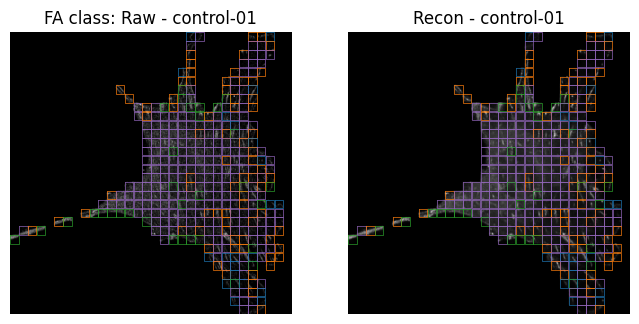

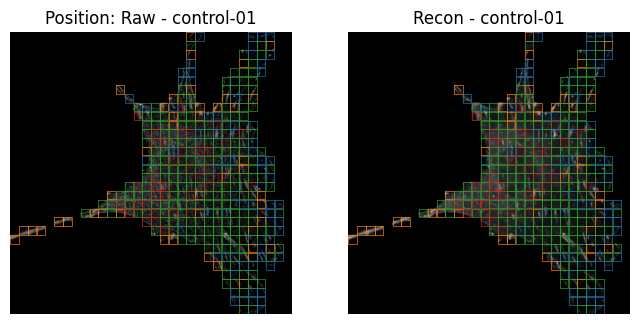

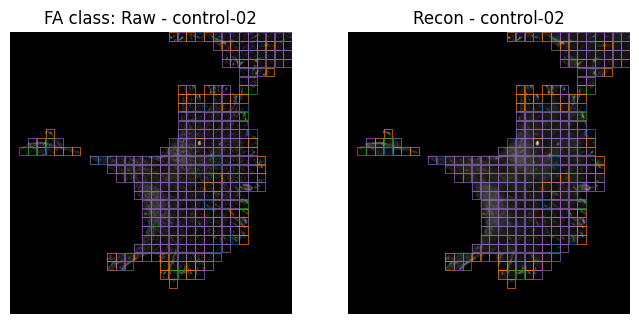

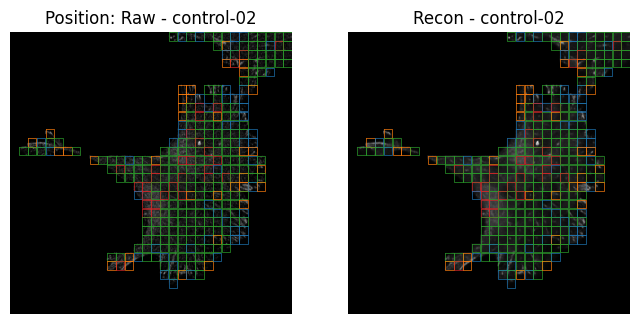

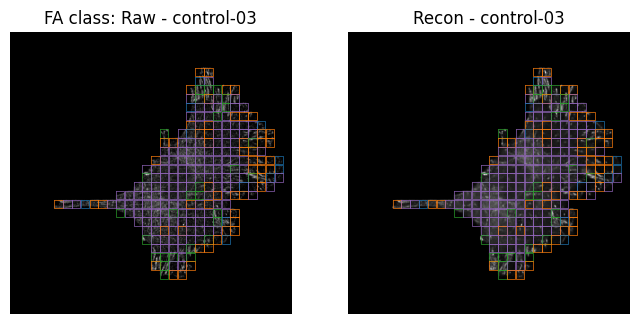

...

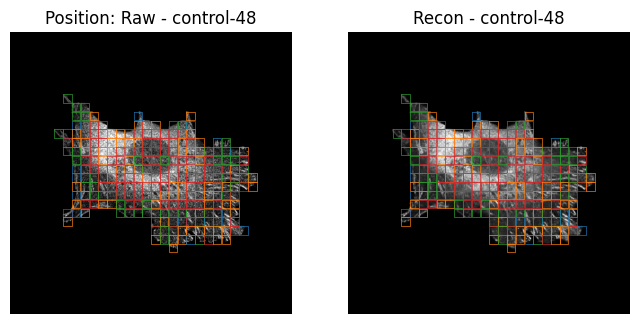

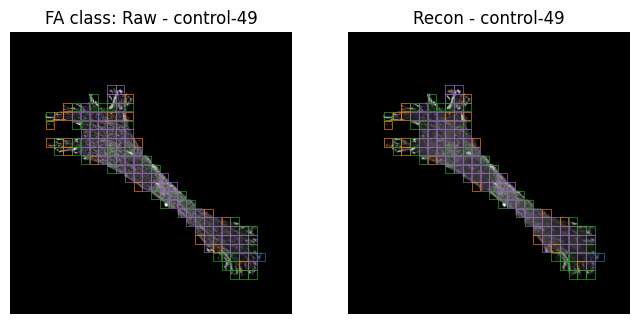

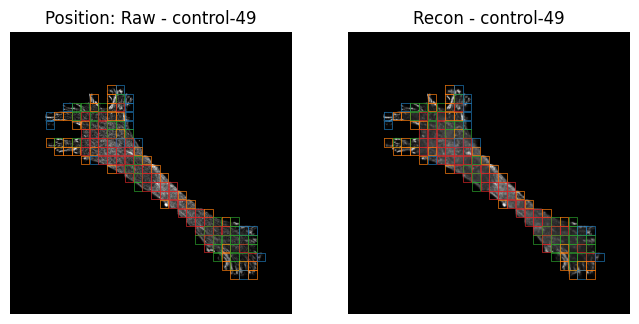

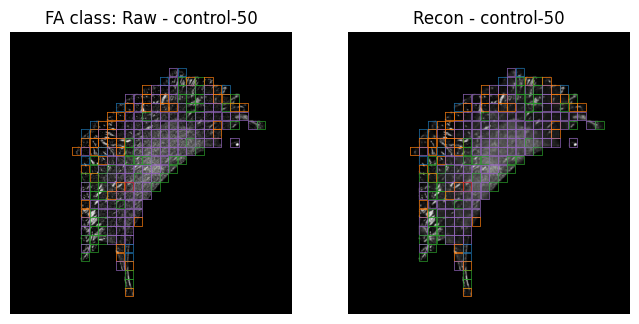

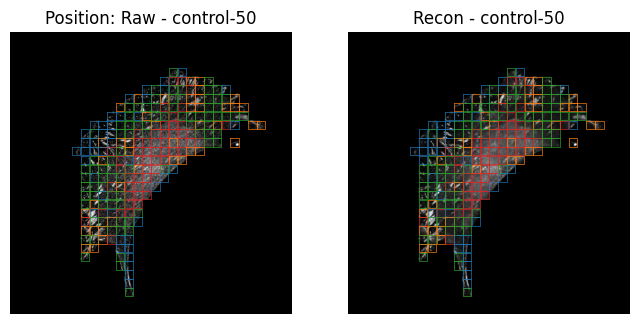

In [13]:
pad_size = 64

all_image_csv = pd.read_csv(os.path.join(csv_folder,csv_filename))

unique_vals = all_image_csv["filename"].unique()
latent_array =  []
index_count=-1

for filename in unique_vals:
    this_file_csv = all_image_csv[all_image_csv["filename"]==filename]
    # print(csv_filename)
    raw_whole_image = np.zeros([1024,1024])
    recon_whole_image = np.zeros([1024,1024])    

    for index, row in this_file_csv.iterrows():       
        index_count = index_count+1 
        x_corner1 = int(row["x_corner1"])
        x_corner3 = int(row["x_corner3"])
        y_corner1 = int(row["y_corner1"])
        y_corner3 = int(row["y_corner3"])
        patch_name = row['crop_img_filename']
                
        raw_patch = tiff.imread(os.path.join(row["movie_partitioned_data_dir"],row["crop_img_filename"] ))
        normed_raw_patch = raw_patch.copy() * 240 
        normed_raw_patch[normed_raw_patch > 254] = 254
        normed_raw_patch = normed_raw_patch/255
        
        tensor_patch = torch.from_numpy(normed_raw_patch)
        tensor_patch = tensor_patch.unsqueeze(0).unsqueeze(0)
        tensor_patch = tensor_patch.to(device)

        ae = ae.to(device)
        with torch.no_grad():
            recon_image, latent = ae(tensor_patch)
        
        latent_np = latent.detach().cpu().numpy()    # shape (1, 8)
        y_pred = gb.predict(latent_np)[0]            # scalar label
        
        latent_array.append(latent)        

        recon_patch_filename = 'fa'+str(int(y_pred)).zfill(3) +"_recon_patch_"+patch_name+'.tif'
    
        tiff.imwrite(
            os.path.join(recon_patch_dir,recon_patch_filename),
            recon_image.squeeze().cpu().detach().numpy().astype(np.float32),
            imagej=True,              # Write ImageJ metadata block
            metadata={'axes': 'YX'}   # Or 'TYX', 'ZYX', etc. depending on shape
        )    
        
        raw_patch_img_filename = 'fa'+str(int(y_pred)).zfill(3) +"_raw_patch_"+patch_name+'.tif'
        
        tiff.imwrite(
            os.path.join(raw_patch_dir,raw_patch_img_filename),
            normed_raw_patch.astype(np.float32),
            imagej=True,              # Write ImageJ metadata block
            metadata={'axes': 'YX'}   # Or 'TYX', 'ZYX', etc. depending on shape
        )

        raw_whole_image[y_corner1-pad_size:y_corner3-pad_size,x_corner1-pad_size:x_corner3-pad_size] = normed_raw_patch
        recon_whole_image[y_corner1-pad_size:y_corner3-pad_size,x_corner1-pad_size:x_corner3-pad_size] = recon_image.squeeze().cpu().detach()
        
    recon_img_filename = "recon_"+filename+'.tif'
    
    tiff.imwrite(
        os.path.join(recon_dir,recon_img_filename),
        recon_whole_image.astype(np.float32),#.swapaxes(0,2),
        imagej=True,              # Write ImageJ metadata block
        metadata={'axes': 'YX'}   # Or 'TYX', 'ZYX', etc. depending on shape
    )    
    
    raw_grid_img_filename = "raw_grid_"+filename+'.tif'
    
    tiff.imwrite(
        os.path.join(raw_grid_dir,raw_grid_img_filename),
        raw_whole_image.astype(np.float32),
        imagej=True,              # Write ImageJ metadata block
        metadata={'axes': 'YX'}   # Or 'TYX', 'ZYX', etc. depending on shape
    )

    fig, ax = plt.subplots(1,2, figsize=(8,4))
    ax[0].imshow(raw_whole_image,cmap=plt.cm.gray)
    ax[0].set_title('FA class: Raw - '+ filename[-14:-4])
    ax[0].axis('off')
    ax[1].imshow(recon_whole_image,cmap=plt.cm.gray)
    ax[1].set_title('Recon - '+ filename[-14:-4])
    ax[1].axis('off')
    fig.savefig(os.path.join(recon_visual_dir,recon_img_filename), dpi=300)
    



    fig1, ax1 = plt.subplots(1,2, figsize=(8,4))
    ax1[0].imshow(raw_whole_image,cmap=plt.cm.gray)
    ax1[0].set_title('Position: Raw - '+ filename[-14:-4])
    ax1[0].axis('off')
    ax1[1].imshow(recon_whole_image,cmap=plt.cm.gray)
    ax1[1].set_title('Recon - '+ filename[-14:-4])
    ax1[1].axis('off')
    
    
    this_file_csv = all_image_csv[all_image_csv["filename"]==filename]
    linewidth=0.6
    for index, row in this_file_csv.iterrows():       
        index_count = index_count+1 
        x_corner1 = int(row["x_corner1"])- pad_size + linewidth 
        x_corner3 = int(row["x_corner3"])- pad_size -linewidth
        y_corner1 = int(row["y_corner1"])- pad_size +linewidth
        y_corner3 = int(row["y_corner3"])- pad_size -linewidth
        patch_name = row['crop_img_filename']
                
        raw_patch = tiff.imread(os.path.join(row["movie_partitioned_data_dir"],row["crop_img_filename"] ))
        normed_raw_patch = raw_patch.copy() * 240 
        normed_raw_patch[normed_raw_patch > 254] = 254
        normed_raw_patch = normed_raw_patch/255
        
        tensor_patch = torch.from_numpy(normed_raw_patch)
        tensor_patch = tensor_patch.unsqueeze(0).unsqueeze(0)
        tensor_patch = tensor_patch.to(device)

        ae = ae.to(device)
        with torch.no_grad():
            recon_image, latent = ae(tensor_patch)
        latent_np = latent.detach().cpu().numpy()    # shape (1, 8)
        y_pred = gb.predict(latent_np)[0]            # scalar label
        position_pred = gb_position.predict(latent_np)[0]            # scalar label
                
        ax[0].plot([x_corner1,x_corner1,x_corner3,x_corner3,x_corner1],\
                   [y_corner1,y_corner3,y_corner3,y_corner1,y_corner1], \
                color = classification_labelID_to_color[y_pred],\
                linewidth=linewidth, alpha=0.8)
        
        ax[1].plot([x_corner1,x_corner1,x_corner3,x_corner3,x_corner1],\
            [y_corner1,y_corner3,y_corner3,y_corner1,y_corner1], \
                color = classification_labelID_to_color[y_pred],\
                linewidth=linewidth, alpha=0.8)
        

        ax1[0].plot([x_corner1,x_corner1,x_corner3,x_corner3,x_corner1],\
                   [y_corner1,y_corner3,y_corner3,y_corner1,y_corner1], \
                color = position_labelID_to_color[position_pred],\
                linewidth=linewidth, alpha=0.8)
        
        ax1[1].plot([x_corner1,x_corner1,x_corner3,x_corner3,x_corner1],\
            [y_corner1,y_corner3,y_corner3,y_corner1,y_corner1], \
                color = position_labelID_to_color[position_pred],\
                linewidth=linewidth, alpha=0.8)
        
    recon_img_filename = "fa_class_pred_recon_"+filename+'.tif'
    fig.savefig(os.path.join(recon_visual_dir,recon_img_filename), dpi=300)
    
    recon_img_filename = "position_pred_recon_"+filename+'.tif'
    fig1.savefig(os.path.join(recon_visual_dir,recon_img_filename), dpi=300)
    
    # break